# ParkCast Vision — Week 1: YOLOv8 End-to-End Detection

**목표**: 전체 주차장 이미지 1장 → 빈 칸/찬 칸을 box로 한 번에 검출

**Pipeline**:
```
[전체 주차장 이미지] → YOLOv8 → [box1: empty, box2: occupied, ...] → 점유율 %
```

**데이터**: Roboflow PKLot v2 (640x640, 12,416장, COCO format)
- train: 8,691장 / valid: ? / test: ?
- 클래스: `space-empty`, `space-occupied`

**산출물**:
- 학습된 YOLOv8 모델 (`best.pt`)
- mAP@0.5, mAP@0.5:0.95, precision, recall
- 테스트 이미지 검출 시각화
- 점유율 자동 계산 함수

## 1. 환경 + 드라이브

In [1]:
import torch
print(f'PyTorch: {torch.__version__}')
print(f'CUDA: {torch.cuda.is_available()}, GPU: {torch.cuda.get_device_name(0) if torch.cuda.is_available() else "-"}')


PyTorch: 2.10.0+cu128
CUDA: True, GPU: Tesla T4


In [2]:
!pip install -q ultralytics pycocotools matplotlib seaborn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 61.4 MB/s eta 0:00:00


In [3]:
from google.colab import drive
import os
drive.mount('/content/drive')

PROJECT_ROOT = '/content/drive/MyDrive/ParkCast'
MODEL_DIR = f'{PROJECT_ROOT}/models'
RESULTS_DIR = f'{PROJECT_ROOT}/results'
os.makedirs(MODEL_DIR, exist_ok=True)
os.makedirs(RESULTS_DIR, exist_ok=True)
print(f'Project root: {PROJECT_ROOT}')

Mounted at /content/drive
Project root: /content/drive/MyDrive/ParkCast


데이터 다운

In [6]:
# kaggle.json 업로드
from google.colab import files
import os

if not os.path.exists('/root/.kaggle/kaggle.json'):
    print('kaggle.json을 다운로드 폴더에서 찾아 업로드해야 함')
    print('(없으면 kaggle.com → Settings → API → Create New Token)')
    uploaded = files.upload()
    os.makedirs('/root/.kaggle', exist_ok=True)
    !mv kaggle.json /root/.kaggle/
    !chmod 600 /root/.kaggle/kaggle.json
    print('키 등록 완료')
else:
    print('키 이미 있음')


kaggle.json을 다운로드 폴더에서 찾아 업로드하세요
(없으면 kaggle.com → Settings → API → Create New Token)


Saving kaggle.json to kaggle.json
키 등록 완료


In [7]:
# 데이터 다운로드 (~5분)
%cd /content
!kaggle datasets download -d ammarnassanalhajali/pklot-dataset

# 받자마자 드라이브에 백업 (다음번을 위해)
!cp pklot-dataset.zip /content/drive/MyDrive/ParkCast/
print('드라이브에 백업 완료 — 다음에 세션 끊겨도 4단계만 돌리면 됨')

/content
Dataset URL: https://www.kaggle.com/datasets/ammarnassanalhajali/pklot-dataset
License(s): unknown
100% 843M/843M [00:45<00:00, 19.6MB/s]

드라이브에 백업 완료 — 다음에 세션 끊겨도 4단계만 돌리면 됨


In [8]:
%cd /content
import os

# 드라이브 백업 있으면 거기서, 없으면 현재 폴더에서
if os.path.exists('/content/drive/MyDrive/ParkCast/pklot-dataset.zip'):
    src = '/content/drive/MyDrive/ParkCast/pklot-dataset.zip'
elif os.path.exists('/content/pklot-dataset.zip'):
    src = '/content/pklot-dataset.zip'
else:
    raise FileNotFoundError('zip 파일을 찾을 수 없음')

print(f'압축 해제 중: {src}')
!unzip -q "{src}" -d /content/
print('완료')
!ls /content/

/content
압축 해제 중: /content/drive/MyDrive/ParkCast/pklot-dataset.zip
완료
drive		   README.dataset.txt	sample_data  train
pklot-dataset.zip  README.roboflow.txt	test	     valid


In [9]:
# 이전에 봤던 구조와 같은지 확인
!ls /content/train | head -3
print('---')
import os
print('json 존재:', os.path.exists('/content/train/_annotations.coco.json'))

2012-09-11_15_16_58_jpg.rf.61d961a86c9a16694403dfcb72cd450c.jpg
2012-09-11_15_27_08_jpg.rf.0f38b15658ce17d10ce40a992adae5ba.jpg
2012-09-11_15_29_29_jpg.rf.3819d0bdff07fb09e87e5cc7d51dc662.jpg
---
json 존재: True


## 2. 데이터 확인 + COCO json 살펴보기

먼저 어노테이션이 어떻게 생겼는지 확인함.


In [11]:
import json

DATA_ROOT = '/content'  # train/, valid/, test/가 있는 곳

# COCO json 구조 살펴보기
with open(f'{DATA_ROOT}/train/_annotations.coco.json') as f:
    coco = json.load(f)

print('Top-level keys:', list(coco.keys()))
print(f'\n# images:      {len(coco["images"]):,}')
print(f'# annotations: {len(coco["annotations"]):,}')
print(f'# categories:  {len(coco["categories"])}')
print(f'\nCategories: {coco["categories"]}')
print(f'\nSample image entry: {coco["images"][0]}')
print(f'\nSample annotation:  {coco["annotations"][0]}')

Top-level keys: ['info', 'licenses', 'categories', 'images', 'annotations']

# images:      8,691
# annotations: 497,856
# categories:  3

Categories: [{'id': 0, 'name': 'spaces', 'supercategory': 'none'}, {'id': 1, 'name': 'space-empty', 'supercategory': 'spaces'}, {'id': 2, 'name': 'space-occupied', 'supercategory': 'spaces'}]

Sample image entry: {'id': 0, 'license': 1, 'file_name': '2013-04-10_12_00_06_jpg.rf.bef78f7879666a6d8997ce513fd8d124.jpg', 'height': 640, 'width': 640, 'date_captured': '2021-01-05T21:55:11+00:00'}

Sample annotation:  {'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [304, 468, 83.5, 114], 'area': 9519, 'segmentation': [], 'iscrowd': 0}


In [12]:
# 각 split별 통계
import pandas as pd
from collections import Counter

stats = []
for split in ['train', 'valid', 'test']:
    with open(f'{DATA_ROOT}/{split}/_annotations.coco.json') as f:
        c = json.load(f)
    cat_id_to_name = {x['id']: x['name'] for x in c['categories']}
    label_counts = Counter(cat_id_to_name[a['category_id']] for a in c['annotations'])
    stats.append({
        'split': split,
        '# images': len(c['images']),
        '# annotations': len(c['annotations']),
        'avg boxes/img': round(len(c['annotations']) / max(len(c['images']), 1), 1),
        **{k: v for k, v in label_counts.items()},
    })

stats_df = pd.DataFrame(stats)
print(stats_df.to_string(index=False))

split  # images  # annotations  avg boxes/img  space-occupied  space-empty
train      8691         497856           57.3          231948       265908
valid      2483         143316           57.7           69687        73629
 test      1242          70684           56.9           34100        36584


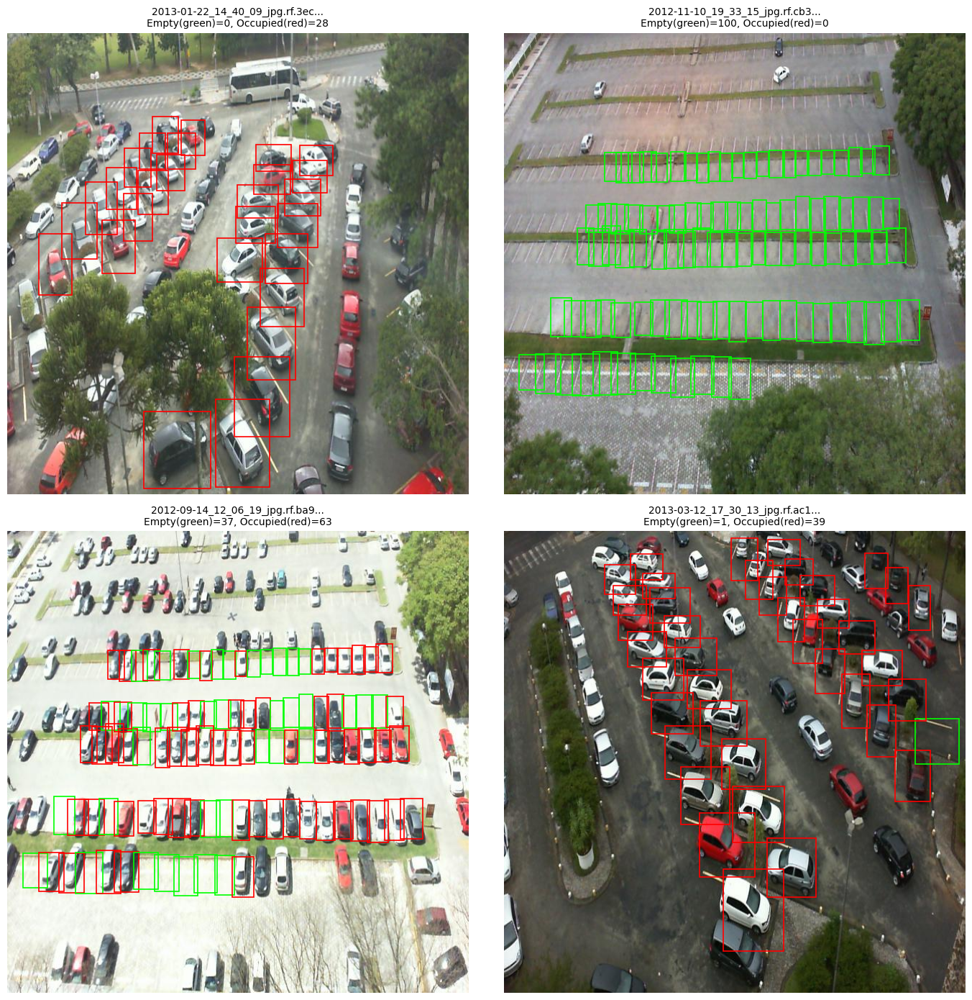

In [13]:
# 샘플 이미지 + bbox 시각화 - 데이터가 진짜 깨끗한지 확인
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import defaultdict

# train annotation 다시 로드
with open(f'{DATA_ROOT}/train/_annotations.coco.json') as f:
    coco_train = json.load(f)
cat_map = {c['id']: c['name'] for c in coco_train['categories']}

# image_id → annotations 매핑
img_to_anns = defaultdict(list)
for ann in coco_train['annotations']:
    img_to_anns[ann['image_id']].append(ann)

# 4장 랜덤 시각화
import random
random.seed(42)
samples = random.sample(coco_train['images'], 4)

fig, axes = plt.subplots(2, 2, figsize=(14, 14))
for ax, img_info in zip(axes.flat, samples):
    img = cv2.imread(f'{DATA_ROOT}/train/{img_info["file_name"]}')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)

    for ann in img_to_anns[img_info['id']]:
        x, y, w, h = ann['bbox']
        cat = cat_map[ann['category_id']]
        color = 'lime' if 'empty' in cat.lower() else 'red'
        rect = patches.Rectangle((x, y), w, h, linewidth=1.2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)

    n_empty = sum(1 for a in img_to_anns[img_info['id']] if 'empty' in cat_map[a['category_id']].lower())
    n_occ = len(img_to_anns[img_info['id']]) - n_empty
    ax.set_title(f'{img_info["file_name"][:30]}...\nEmpty(green)={n_empty}, Occupied(red)={n_occ}', fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/eda_samples.png', dpi=120)
plt.show()

## 3. COCO → YOLO format 변환

Ultralytics YOLOv8은 다음 구조를 요구함:
```
data/
├── train/
│   ├── images/*.jpg
│   └── labels/*.txt   # 각 줄: class x_center y_center w h (모두 0~1 정규화)
├── valid/...
└── test/...
data.yaml
```

현재는 이미지가 split 폴더에 그냥 있고 라벨은 한 json 안에 있음. 변환함.


In [14]:
import shutil
from pathlib import Path
from tqdm.auto import tqdm

YOLO_ROOT = '/content/pklot_yolo'

def coco_to_yolo(split):
    src_dir = Path(DATA_ROOT) / split
    dst_img = Path(YOLO_ROOT) / split / 'images'
    dst_lbl = Path(YOLO_ROOT) / split / 'labels'
    dst_img.mkdir(parents=True, exist_ok=True)
    dst_lbl.mkdir(parents=True, exist_ok=True)

    with open(src_dir / '_annotations.coco.json') as f:
        c = json.load(f)

    # COCO category_id → 0-base YOLO class id로 매핑
    # categories를 정렬해서 일관된 인덱스 부여
    cats_sorted = sorted(c['categories'], key=lambda x: x['id'])
    cat_id_to_yolo = {cat['id']: i for i, cat in enumerate(cats_sorted)}
    yolo_names = [cat['name'] for cat in cats_sorted]

    # supercategory가 0번에 잡히는 경우 제외 (Roboflow는 종종 dummy 'PKLot' 카테고리를 0번에 둠)
    # 실제 어노테이션에 등장하는 category_id만 보존
    used_cats = set(a['category_id'] for a in c['annotations'])

    img_id_to_info = {im['id']: im for im in c['images']}
    img_to_anns_local = defaultdict(list)
    for a in c['annotations']:
        img_to_anns_local[a['image_id']].append(a)

    # 라벨 + 이미지 복사
    for img_info in tqdm(c['images'], desc=f'{split} convert'):
        fname = img_info['file_name']
        W, H = img_info['width'], img_info['height']

        # 이미지 심볼릭 링크 (복사하면 용량 많음)
        src_path = src_dir / fname
        dst_path = dst_img / fname
        if not dst_path.exists():
            try:
                os.symlink(src_path.resolve(), dst_path)
            except FileExistsError:
                pass

        # 라벨 txt 작성
        lines = []
        for a in img_to_anns_local[img_info['id']]:
            cls = cat_id_to_yolo[a['category_id']]
            x, y, w, h = a['bbox']
            cx = (x + w / 2) / W
            cy = (y + h / 2) / H
            nw = w / W
            nh = h / H
            lines.append(f'{cls} {cx:.6f} {cy:.6f} {nw:.6f} {nh:.6f}')

        lbl_path = dst_lbl / (Path(fname).stem + '.txt')
        with open(lbl_path, 'w') as f:
            f.write('\n'.join(lines))

    return yolo_names, used_cats, cat_id_to_yolo

yolo_names, used_cats, cat_id_to_yolo = coco_to_yolo('train')
_ = coco_to_yolo('valid')
_ = coco_to_yolo('test')

print(f'\nYOLO class names (in order): {yolo_names}')
print(f'COCO category_ids actually used in annotations: {used_cats}')
print(f'cat_id_to_yolo mapping: {cat_id_to_yolo}')

train convert:   0%|          | 0/8691 [00:00<?, ?it/s]

valid convert:   0%|          | 0/2483 [00:00<?, ?it/s]

test convert:   0%|          | 0/1242 [00:00<?, ?it/s]


YOLO class names (in order): ['spaces', 'space-empty', 'space-occupied']
COCO category_ids actually used in annotations: {1, 2}
cat_id_to_yolo mapping: {0: 0, 1: 1, 2: 2}


In [15]:
# Roboflow는 종종 dummy supercategory를 추가해서 클래스가 3개로 보일 수 있음
# (예: ['PKLot', 'space-empty', 'space-occupied']) - 실제 라벨에 PKLot은 안 쓰이지만 인덱스 차지
# 이 경우 사용 안 되는 클래스도 yaml에는 적어둬야 함 (인덱스 보존)

# 실제로 라벨 파일에 등장하는 클래스 인덱스 확인
import glob
used_yolo_indices = set()
for txt in glob.glob(f'{YOLO_ROOT}/train/labels/*.txt')[:500]:
    with open(txt) as f:
        for line in f:
            if line.strip():
                used_yolo_indices.add(int(line.split()[0]))
print(f'YOLO indices actually present in train labels: {sorted(used_yolo_indices)}')

YOLO indices actually present in train labels: [1, 2]


In [16]:
# data.yaml 작성
yaml_content = f'''path: {YOLO_ROOT}
train: train/images
val: valid/images
test: test/images

nc: {len(yolo_names)}
names: {yolo_names}
'''
with open(f'{YOLO_ROOT}/data.yaml', 'w') as f:
    f.write(yaml_content)
print(yaml_content)
!cat {YOLO_ROOT}/data.yaml

path: /content/pklot_yolo
train: train/images
val: valid/images
test: test/images

nc: 3
names: ['spaces', 'space-empty', 'space-occupied']

path: /content/pklot_yolo
train: train/images
val: valid/images
test: test/images

nc: 3
names: ['spaces', 'space-empty', 'space-occupied']


In [17]:
# 변환 결과 확인 - 라벨 1개 열어보기
sample_lbl = glob.glob(f'{YOLO_ROOT}/train/labels/*.txt')[0]
print(f'Sample label file: {sample_lbl}')
with open(sample_lbl) as f:
    print(f.read()[:500])

# 이미지 개수 확인
for split in ['train', 'valid', 'test']:
    n_img = len(glob.glob(f'{YOLO_ROOT}/{split}/images/*.jpg'))
    n_lbl = len(glob.glob(f'{YOLO_ROOT}/{split}/labels/*.txt'))
    print(f'{split:6s}  images: {n_img:>5}   labels: {n_lbl:>5}')

Sample label file: /content/pklot_yolo/train/labels/2012-12-12_19_15_15_jpg.rf.9eee7ce91f47586bb795fd400c7e00c1.txt
2 0.566016 0.866016 0.125781 0.207031
2 0.606250 0.720313 0.115625 0.187500
2 0.635938 0.624219 0.103125 0.139063
2 0.653516 0.522656 0.100781 0.148438
2 0.675000 0.451953 0.084375 0.119531
2 0.691406 0.374609 0.082812 0.108594
2 0.706641 0.319531 0.082031 0.098437
2 0.723437 0.271484 0.081250 0.083594
2 0.734766 0.226562 0.066406 0.071875
2 0.436719 0.866016 0.139063 0.169531
2 0.576172 0.437109 0.092969 0.092969
2 0.601562 0.375391 0.090625 0.078906
2 0.620703 0.314063 0.091406 0.078125
2 0.63
train   images:  8691   labels:  8691
valid   images:  2483   labels:  2483
test    images:  1242   labels:  1242


## 4. YOLOv8 학습

**모델 선택**: YOLOv8n (nano) — 가볍고 빠름. 정확도가 부족하면 YOLOv8s로 업그레이드.

**중요**: PKLot은 한 이미지에 박스가 50~100개씩 있는 dense detection이라, 일반 COCO보다 학습이 빨리 수렴함. 30 epoch면 충분함.


In [18]:
from ultralytics import YOLO

# pretrained YOLOv8n에서 시작 (transfer learning)
model = YOLO('yolov8n.pt')

results = model.train(
    data=f'{YOLO_ROOT}/data.yaml',
    epochs=30,
    imgsz=640,
    batch=32,                    # GPU 메모리 부족하면 16으로 낮춤
    device=0,
    project=RESULTS_DIR,
    name='yolov8n_pklot_v1',
    patience=10,                 # 10 epoch 개선 없으면 early stop
    save_period=10,
    cos_lr=True,
    lr0=0.01,
    # 데이터 증강 - PKLot은 카메라 고정이라 강한 회전·flip은 오히려 안 좋음
    degrees=2.0,
    translate=0.05,
    scale=0.1,
    fliplr=0.0,                  # 좌우반전 끔: 같은 카메라 시점 유지
    mosaic=0.5,
    plots=True,
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.46 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/pklot_yolo/data.yaml, degrees=2.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz

## 5. 학습 결과 확인

In [19]:
# Ultralytics가 학습 plot을 자동 저장
from IPython.display import Image as IPImage, display

run_dir = f'{RESULTS_DIR}/yolov8n_pklot_v1'
print(f'Run directory: {run_dir}')
!ls {run_dir}

Run directory: /content/drive/MyDrive/ParkCast/results/yolov8n_pklot_v1
args.yaml			 results.csv	      val_batch0_labels.jpg
BoxF1_curve.png			 results.png	      val_batch0_pred.jpg
BoxP_curve.png			 train_batch0.jpg     val_batch1_labels.jpg
BoxPR_curve.png			 train_batch1.jpg     val_batch1_pred.jpg
BoxR_curve.png			 train_batch2.jpg     val_batch2_labels.jpg
confusion_matrix_normalized.png  train_batch5440.jpg  val_batch2_pred.jpg
confusion_matrix.png		 train_batch5441.jpg  weights
labels.jpg			 train_batch5442.jpg


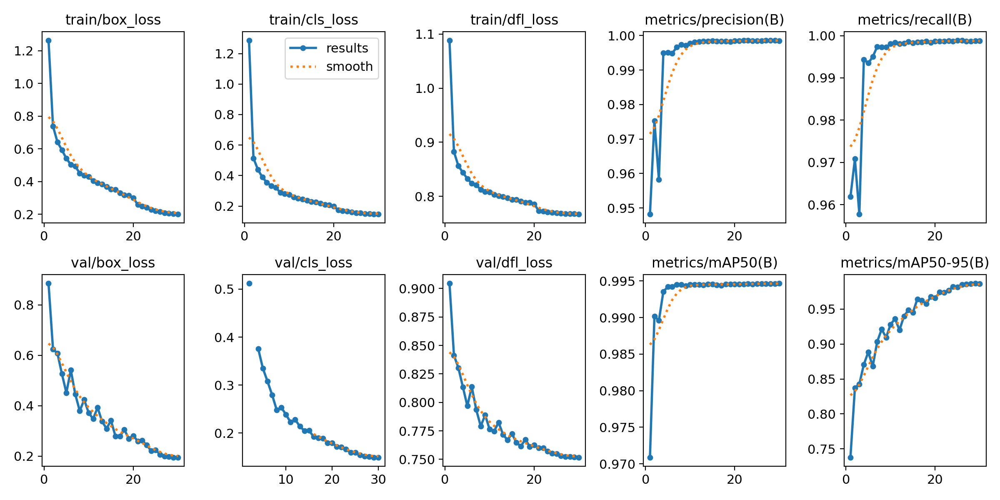

In [20]:
# Training curves
results_png = f'{run_dir}/results.png'
if os.path.exists(results_png):
    display(IPImage(results_png))

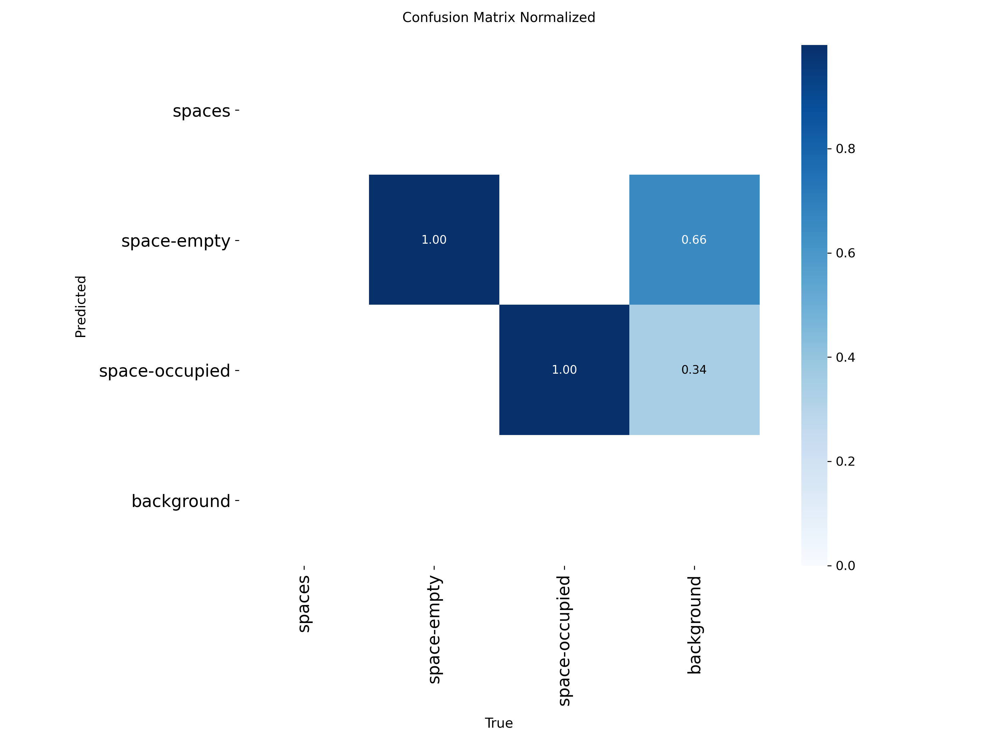

In [21]:
# Confusion matrix (normalized)
cm_png = f'{run_dir}/confusion_matrix_normalized.png'
if os.path.exists(cm_png):
    display(IPImage(cm_png))

--- val_batch0_pred.jpg ---


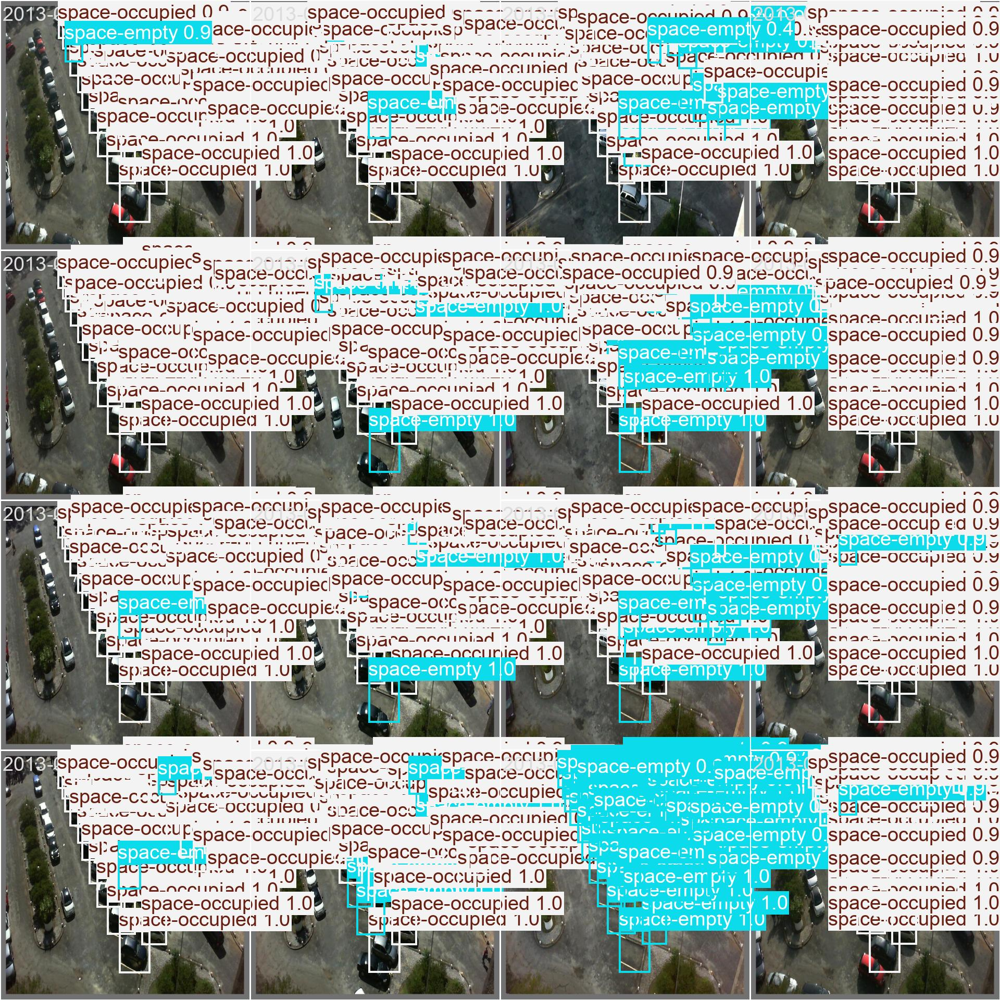

--- val_batch0_labels.jpg ---


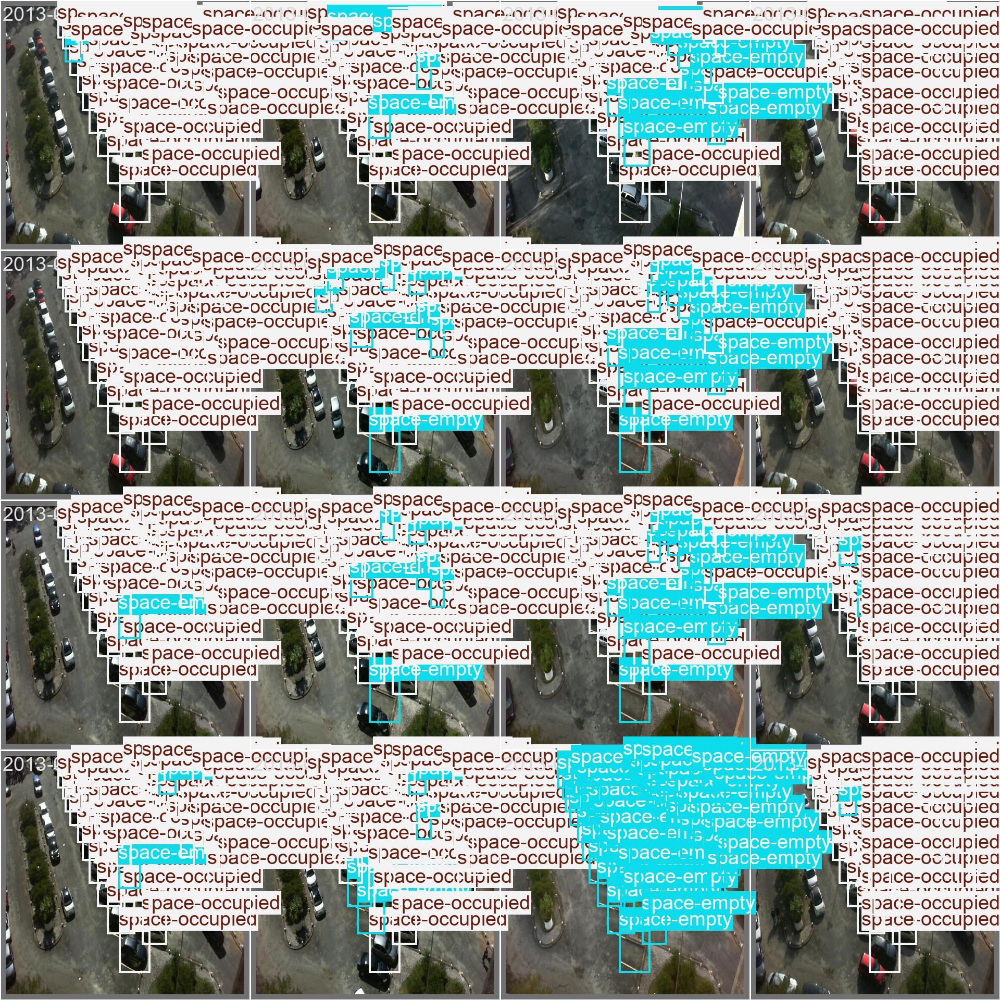

In [22]:
# val 예측 시각화 (Ultralytics가 자동 생성)
for fn in ['val_batch0_pred.jpg', 'val_batch0_labels.jpg']:
    p = f'{run_dir}/{fn}'
    if os.path.exists(p):
        print(f'--- {fn} ---')
        display(IPImage(p))

## 6. Test set 평가 (학습에서 안 본 데이터)

이게 실제 확인하려는 숫자임. valid는 학습 중 monitor에 쓰여서 약간 leak됨.


In [23]:
best = YOLO(f'{run_dir}/weights/best.pt')
test_metrics = best.val(
    data=f'{YOLO_ROOT}/data.yaml',
    split='test',
    imgsz=640,
    batch=32,
    project=RESULTS_DIR,
    name='yolov8n_pklot_v1_test',
    plots=True,
)
print(f'\n=== TEST SET RESULTS ===')
print(f'mAP50:      {test_metrics.box.map50:.4f}')
print(f'mAP50-95:   {test_metrics.box.map:.4f}')
print(f'precision:  {test_metrics.box.mp:.4f}')
print(f'recall:     {test_metrics.box.mr:.4f}')
print(f'\nPer-class mAP50:')
for i, name in enumerate(yolo_names):
    if i < len(test_metrics.box.maps):
        print(f'  {name:20s} {test_metrics.box.maps[i]:.4f}')

Ultralytics 8.4.46 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 921.2±212.7 MB/s, size: 73.3 KB)
val: Scanning /content/pklot_yolo/test/labels... 1242 images, 26 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1242/1242 1.1Kit/s 1.2s
val: New cache created: /content/pklot_yolo/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 39/39 1.2it/s 31.8s
                   all       1242      70684      0.998      0.997      0.994      0.989
           space-empty       1041      36584      0.996      0.996      0.994       0.99
        space-occupied        991      34100      0.999      0.999      0.995      0.987
Speed: 2.2ms preprocess, 4.1ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to /content/drive/MyDrive/ParkCast/results/yolov8n_pklot_v1_test

=== 

## 7. 예측 + 점유율 자동 계산

PDF의 ParkCast 비전 = 한 장 입력 → 점유 현황 + 비율 출력. 그걸 만듦.



=== Demo 1: 2012-10-13_09_48_43_jpg.rf.94a1151d06eb2... ===


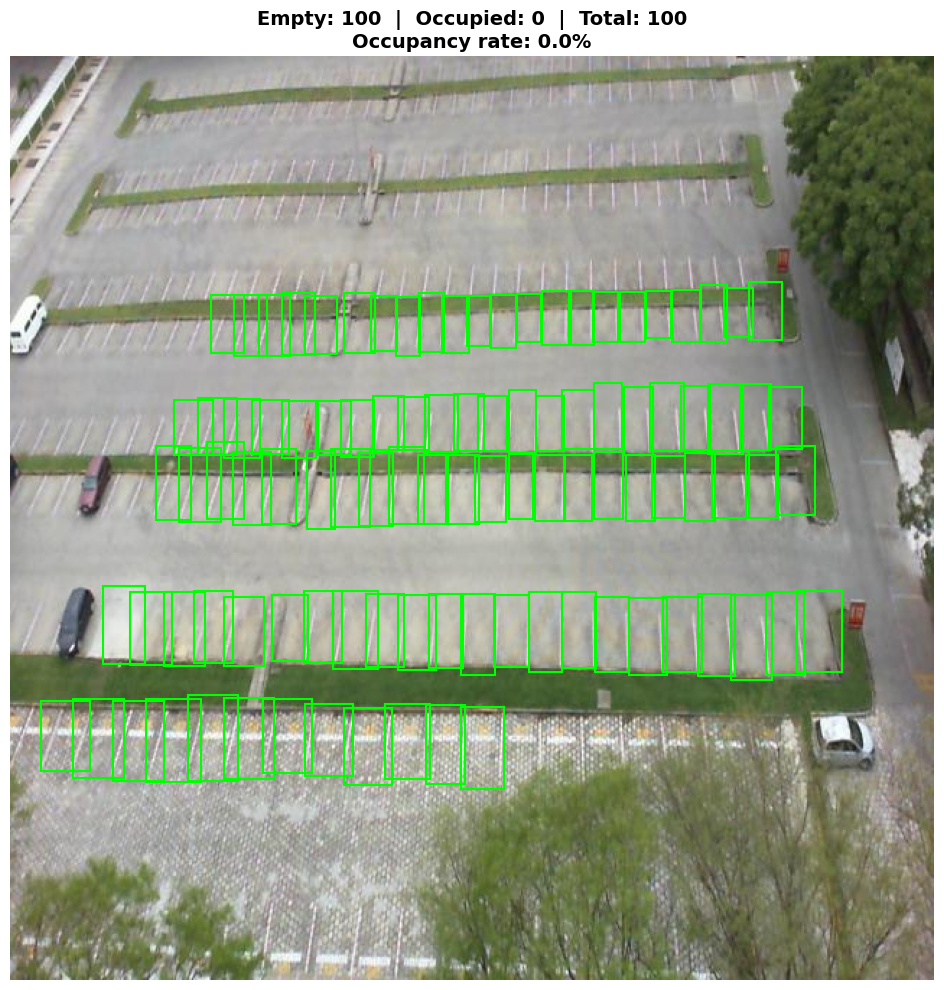

{'n_empty': 100, 'n_occupied': 0, 'n_total': 100, 'occupancy_rate': 0.0}

=== Demo 2: 2012-12-14_15_30_12_jpg.rf.13862c29b3afe... ===


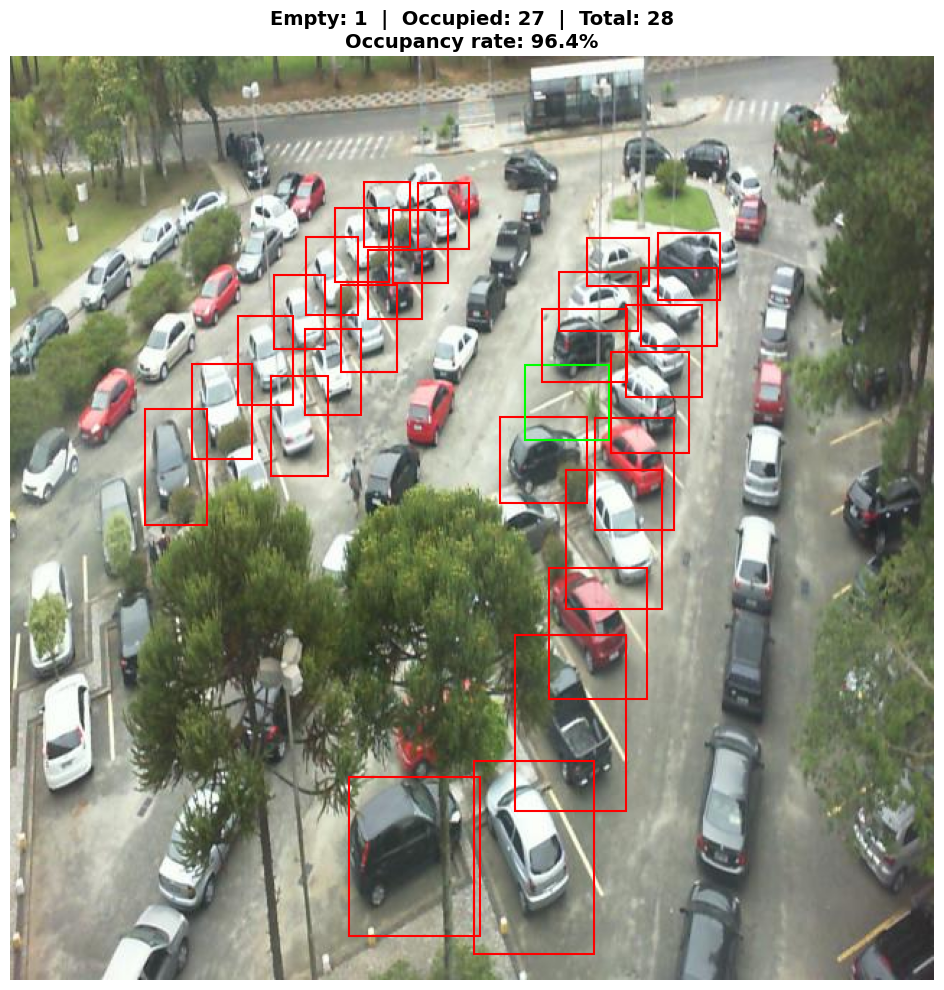

{'n_empty': 1, 'n_occupied': 27, 'n_total': 28, 'occupancy_rate': 96.42857142857143}

=== Demo 3: 2013-03-19_12_05_07_jpg.rf.90ae1eca0a0bd... ===


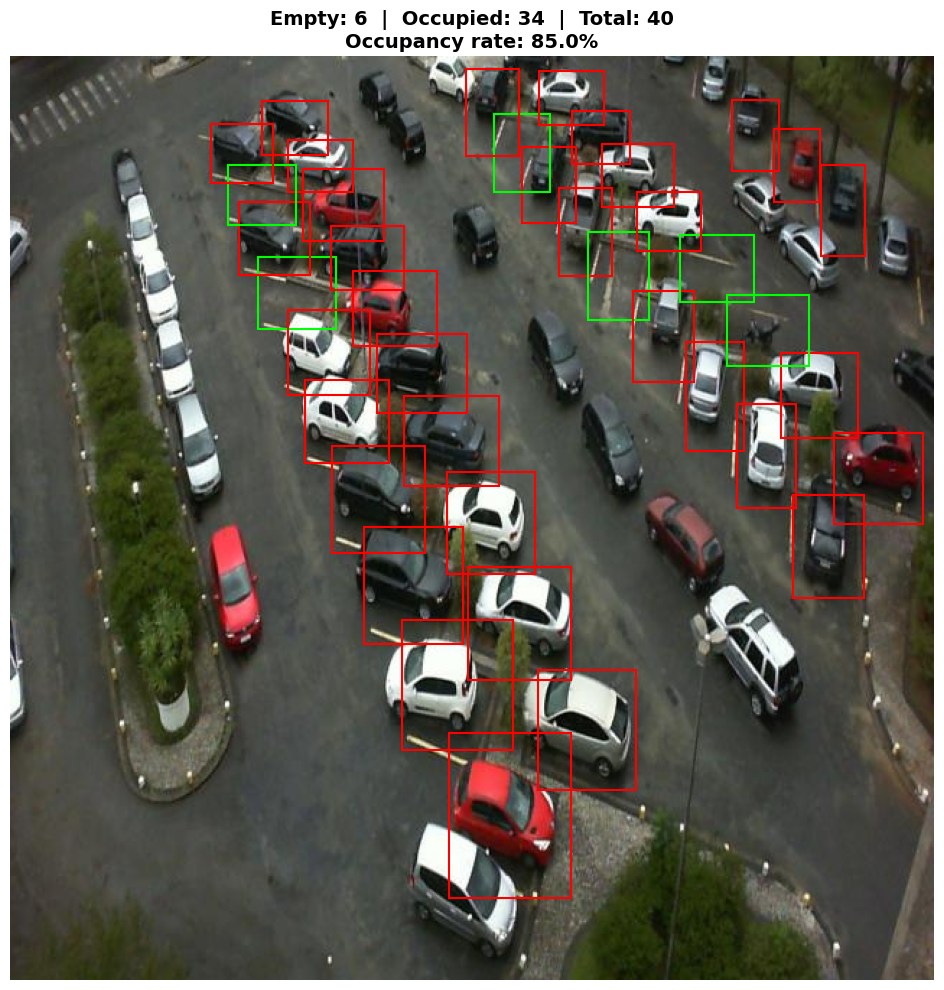

{'n_empty': 6, 'n_occupied': 34, 'n_total': 40, 'occupancy_rate': 85.0}

=== Demo 4: 2013-04-15_12_25_07_jpg.rf.2eb06de03e167... ===


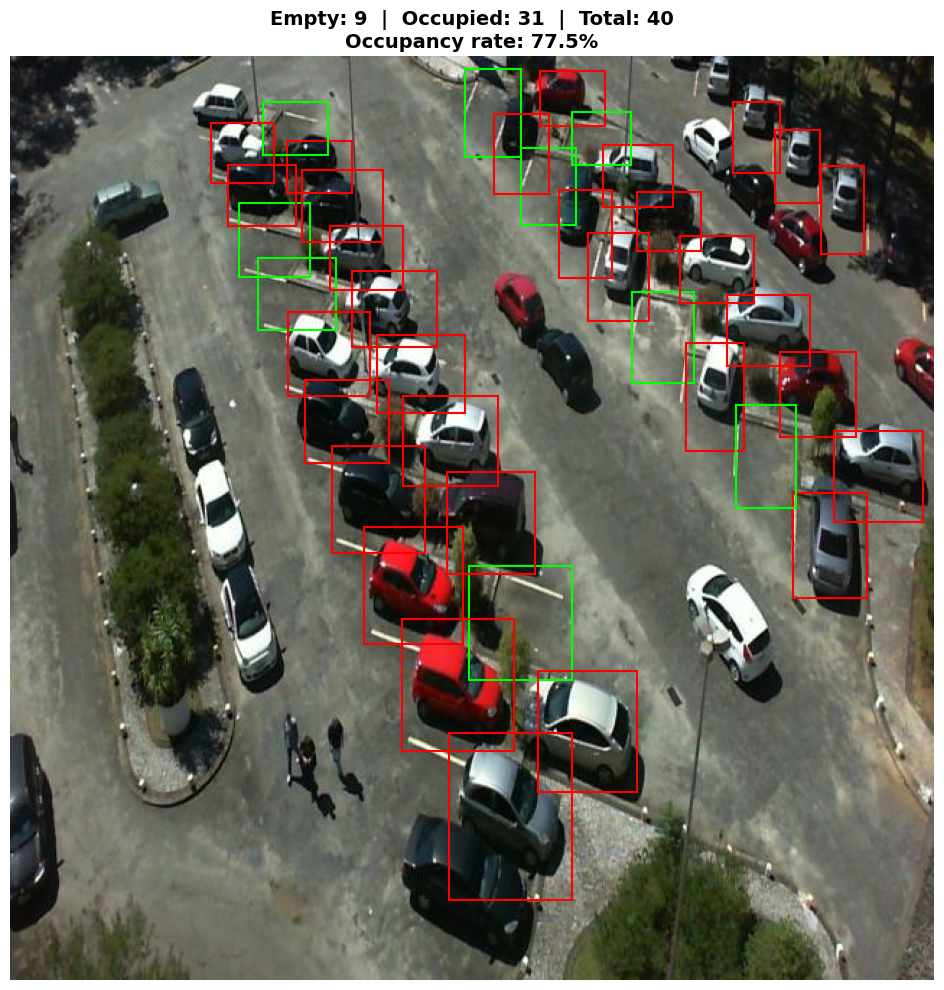

{'n_empty': 9, 'n_occupied': 31, 'n_total': 40, 'occupancy_rate': 77.5}


In [24]:
import numpy as np

def predict_occupancy(model, image_path, conf=0.4, save_path=None):
    """한 장 → 검출 + 점유율 시각화"""
    results = model(image_path, conf=conf, verbose=False)
    r = results[0]
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # 클래스 카운트
    cls_ids = r.boxes.cls.cpu().numpy().astype(int)
    name_to_count = Counter(yolo_names[c] for c in cls_ids)
    n_empty = sum(v for k, v in name_to_count.items() if 'empty' in k.lower())
    n_occ = sum(v for k, v in name_to_count.items() if 'occupied' in k.lower())
    n_total = n_empty + n_occ
    occ_rate = n_occ / n_total * 100 if n_total > 0 else 0

    # 시각화
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(img)

    boxes = r.boxes.xyxy.cpu().numpy()
    confs = r.boxes.conf.cpu().numpy()
    for (x1, y1, x2, y2), cls, cf in zip(boxes, cls_ids, confs):
        name = yolo_names[cls]
        color = 'lime' if 'empty' in name.lower() else 'red'
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1.5, edgecolor=color, facecolor='none')
        ax.add_patch(rect)

    title = (f'Empty: {n_empty}  |  Occupied: {n_occ}  |  Total: {n_total}\n'
             f'Occupancy rate: {occ_rate:.1f}%')
    ax.set_title(title, fontsize=14, fontweight='bold')
    ax.axis('off')

    if save_path:
        plt.savefig(save_path, dpi=120, bbox_inches='tight')
    plt.show()

    return {
        'n_empty': n_empty, 'n_occupied': n_occ, 'n_total': n_total,
        'occupancy_rate': occ_rate,
    }

# 테스트 이미지 4장 데모
test_imgs = sorted(glob.glob(f'{YOLO_ROOT}/test/images/*.jpg'))
demo_imgs = random.sample(test_imgs, 4)

for i, ip in enumerate(demo_imgs):
    print(f'\n=== Demo {i+1}: {os.path.basename(ip)[:40]}... ===')
    result = predict_occupancy(best, ip, conf=0.4,
                                save_path=f'{RESULTS_DIR}/demo_{i+1}.png')
    print(result)

## 8. 실패 케이스 분석

GT와 prediction이 가장 다른 이미지들을 찾아서 "왜 틀렸는가"를 분석함.


In [25]:
# 각 test 이미지에 대해 GT 점유 카운트 vs 예측 점유 카운트 비교
with open(f'{DATA_ROOT}/test/_annotations.coco.json') as f:
    coco_test = json.load(f)

test_cat_map = {c['id']: c['name'] for c in coco_test['categories']}
img_to_gt = defaultdict(lambda: {'empty': 0, 'occupied': 0})
for a in coco_test['annotations']:
    name = test_cat_map[a['category_id']]
    if 'empty' in name.lower():
        img_to_gt[a['image_id']]['empty'] += 1
    elif 'occupied' in name.lower():
        img_to_gt[a['image_id']]['occupied'] += 1

img_id_to_fname = {im['id']: im['file_name'] for im in coco_test['images']}

# 각 test 이미지 예측 (시간 절약 위해 200장 샘플)
sample_ids = random.sample(list(img_id_to_fname.keys()), min(200, len(img_id_to_fname)))

diffs = []
for img_id in tqdm(sample_ids, desc='comparing GT vs pred'):
    fname = img_id_to_fname[img_id]
    img_path = f'{YOLO_ROOT}/test/images/{fname}'
    if not os.path.exists(img_path):
        continue
    r = best(img_path, conf=0.4, verbose=False)[0]
    cls_ids = r.boxes.cls.cpu().numpy().astype(int)
    pred_empty = sum(1 for c in cls_ids if 'empty' in yolo_names[c].lower())
    pred_occ = sum(1 for c in cls_ids if 'occupied' in yolo_names[c].lower())

    gt = img_to_gt[img_id]
    gt_total = gt['empty'] + gt['occupied']
    pred_total = pred_empty + pred_occ

    diffs.append({
        'fname': fname,
        'img_path': img_path,
        'gt_empty': gt['empty'], 'gt_occ': gt['occupied'], 'gt_total': gt_total,
        'pred_empty': pred_empty, 'pred_occ': pred_occ, 'pred_total': pred_total,
        'count_diff': abs(gt_total - pred_total),
        'occ_rate_gt': gt['occupied'] / max(gt_total, 1),
        'occ_rate_pred': pred_occ / max(pred_total, 1),
    })

diff_df = pd.DataFrame(diffs)
diff_df['occ_rate_diff'] = (diff_df['occ_rate_gt'] - diff_df['occ_rate_pred']).abs()
print(f'평균 box count 차이: {diff_df["count_diff"].mean():.2f}')
print(f'평균 점유율 차이: {diff_df["occ_rate_diff"].mean()*100:.2f}%')
print(f'\n점유율 오차 큰 케이스 Top 6:')
print(diff_df.nlargest(6, 'occ_rate_diff')[['fname', 'gt_total', 'pred_total', 'occ_rate_gt', 'occ_rate_pred']])

comparing GT vs pred:   0%|          | 0/200 [00:00<?, ?it/s]

평균 box count 차이: 0.03
평균 점유율 차이: 0.27%

점유율 오차 큰 케이스 Top 6:
                                                 fname  gt_total  pred_total  \
89   2012-09-14_15_41_27_jpg.rf.ca488c16146f64b4f9f...       100         100   
41   2012-12-16_17_20_14_jpg.rf.833ed54e6ff0eb5a846...        28          28   
98   2013-01-29_20_16_22_jpg.rf.a15f18a0b3e3732edb3...        28          28   
15   2013-01-17_19_45_16_jpg.rf.d8d309a04280f3023fd...        28          28   
51   2012-12-21_09_55_05_jpg.rf.f8341ff432f9a17b4f7...        28          28   
141  2012-12-16_17_35_14_jpg.rf.eefe69e4032e3b2523a...        28          28   

     occ_rate_gt  occ_rate_pred  
89      0.910000       0.710000  
41      0.928571       1.000000  
98      0.857143       0.892857  
15      0.178571       0.142857  
51      0.964286       1.000000  
141     0.928571       0.964286  


/tmp/ipykernel_890/421888322.py:26: UserWarning: Glyph 51216 (\N{HANGUL SYLLABLE JEOM}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_890/421888322.py:26: UserWarning: Glyph 50976 (\N{HANGUL SYLLABLE YU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_890/421888322.py:26: UserWarning: Glyph 50984 (\N{HANGUL SYLLABLE YUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_890/421888322.py:26: UserWarning: Glyph 50696 (\N{HANGUL SYLLABLE YE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_890/421888322.py:26: UserWarning: Glyph 52769 (\N{HANGUL SYLLABLE CEUG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_890/421888322.py:26: UserWarning: Glyph 51060 (\N{HANGUL SYLLABLE I}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_890/421888322.py:26: UserWarning: Glyph 44032 (\N{HANGUL SYLLABLE GA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipyk

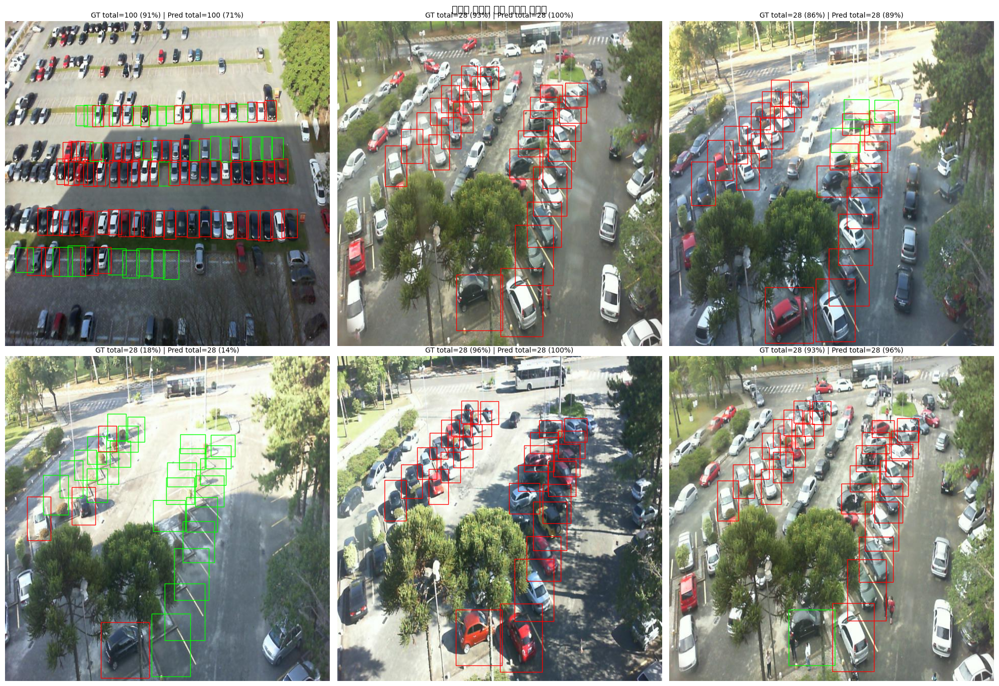

In [26]:
# 가장 틀린 케이스 6장 시각화
worst = diff_df.nlargest(6, 'occ_rate_diff')

fig, axes = plt.subplots(2, 3, figsize=(20, 14))
for ax, (_, row) in zip(axes.flat, worst.iterrows()):
    r = best(row['img_path'], conf=0.4, verbose=False)[0]
    img = cv2.imread(row['img_path'])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)

    cls_ids = r.boxes.cls.cpu().numpy().astype(int)
    boxes = r.boxes.xyxy.cpu().numpy()
    for (x1, y1, x2, y2), cls in zip(boxes, cls_ids):
        color = 'lime' if 'empty' in yolo_names[cls].lower() else 'red'
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor=color, facecolor='none')
        ax.add_patch(rect)

    ax.set_title(
        f'GT total={row["gt_total"]} ({row["occ_rate_gt"]*100:.0f}%) | '
        f'Pred total={row["pred_total"]} ({row["occ_rate_pred"]*100:.0f}%)',
        fontsize=10
    )
    ax.axis('off')

plt.suptitle('점유율 예측이 가장 어긋난 케이스', fontsize=14)
plt.tight_layout()
plt.savefig(f'{RESULTS_DIR}/failure_cases.png', dpi=120)
plt.show()

# 확인할 후보 패턴: 야간 이미지 오인식, 원경 소형 박스 누락, 우천 시 오검출 등

## 9. 모델 저장 + 최종 요약

In [27]:
# best.pt를 드라이브에 영속 저장
shutil.copy(f'{run_dir}/weights/best.pt', f'{MODEL_DIR}/yolov8n_pklot_week1_best.pt')
print(f'Saved: {MODEL_DIR}/yolov8n_pklot_week1_best.pt')

# 결과 요약 텍스트
summary = f'''ParkCast Vision - Week 1 (YOLOv8 End-to-End Detection)
============================================================
Setup:
  Dataset: PKLot (Roboflow v2, 640x640, COCO format)
  Train/Valid/Test: {stats_df.iloc[0]["# images"]}/{stats_df.iloc[1]["# images"]}/{stats_df.iloc[2]["# images"]} images
  Total annotations: {sum(stats_df["# annotations"]):,}
  Classes: {yolo_names}
  Model: YOLOv8n (pretrained COCO)
  Image size: 640
  Epochs: 30 (early stop patience=10)

Test Set Results:
  mAP50:     {test_metrics.box.map50:.4f}
  mAP50-95:  {test_metrics.box.map:.4f}
  Precision: {test_metrics.box.mp:.4f}
  Recall:    {test_metrics.box.mr:.4f}

Occupancy Rate Estimation (200 sample test images):
  Mean box count diff: {diff_df["count_diff"].mean():.2f}
  Mean occupancy rate diff: {diff_df["occ_rate_diff"].mean()*100:.2f}%

Files saved to: {PROJECT_ROOT}
'''
with open(f'{RESULTS_DIR}/week1_summary.txt', 'w') as f:
    f.write(summary)
print(summary)

Saved: /content/drive/MyDrive/ParkCast/models/yolov8n_pklot_week1_best.pt
ParkCast Vision - Week 1 (YOLOv8 End-to-End Detection)
Setup:
  Dataset: PKLot (Roboflow v2, 640x640, COCO format)
  Train/Valid/Test: 8691/2483/1242 images
  Total annotations: 711,856
  Classes: ['spaces', 'space-empty', 'space-occupied']
  Model: YOLOv8n (pretrained COCO)
  Image size: 640
  Epochs: 30 (early stop patience=10)

Test Set Results:
  mAP50:     0.9944
  mAP50-95:  0.9886
  Precision: 0.9977
  Recall:    0.9975

Occupancy Rate Estimation (200 sample test images):
  Mean box count diff: 0.03
  Mean occupancy rate diff: 0.27%

Files saved to: /content/drive/MyDrive/ParkCast



## Week 1 끝 — 다음 계획

**Week 2: Cross-lot 일반화 분석**
- 현재 학습은 train/test가 모두 3개 주차장(PUCPR/UFPR04/UFPR05) 섞여 있음 → 같은 카메라가 train/test 양쪽에 등장 → 너무 쉬움
- 파일명에서 lot 정보 추출 → 특정 주차장만으로 학습 → 나머지 주차장으로 테스트
- mAP가 얼마나 떨어지는지로 도메인 갭의 크기를 가늠함

**Week 3: 2-Stage 비교**
- 지금 모델: 1-stage detection (직접 empty/occupied 검출)
- 비교군: YOLO 차량 검출(COCO pretrained 그대로) + 칸 polygon과 IoR 매칭 (PDF의 ParkCast 방식)
- 어느 쪽이 더 정확한가? 어느 쪽이 더 일반화되는가?

**Week 4: Gradio 데모 + README**
- 이미지 업로드 → 실시간 점유 시각화 + 점유율 표시 웹 데모
- GitHub README 작성
- ParkCast PDF 보고서와 코드 연결


In [28]:
# 파일명 패턴 확인
import os, glob, random
random.seed(0)
sample_files = random.sample(glob.glob('/content/train/*.jpg'), 20)
for f in sample_files:
    print(os.path.basename(f))

2012-12-25_16_20_11_jpg.rf.0ac5dd10eb4929c3b3eb9b42f25a3613.jpg
2013-03-10_09_05_03_jpg.rf.38da736fef96a23d3ad92ef93f31e0ff.jpg
2013-04-12_11_10_05_jpg.rf.43cdee9826f29bbe91f0246f503699fc.jpg
2013-04-15_07_30_01_jpg.rf.556f77c2884cb5cc4c26e7f15ebf264b.jpg
2013-01-17_20_10_16_jpg.rf.8eda523db84951eee709753b4a2d9e94.jpg
2012-11-08_14_00_46_jpg.rf.1f1113234a69ba2b009af4cca4491903.jpg
2012-10-28_15_52_13_jpg.rf.8fa2d5d04c32cc7c7e3a475a35a5f11b.jpg
2012-11-08_16_25_53_jpg.rf.6adeddb5b6ac0dcb4693cfbc2ed15e86.jpg
2012-11-09_08_41_38_jpg.rf.e38d4ff4a07c41d2d6eb7f92475caa5c.jpg
2013-01-20_18_15_14_jpg.rf.db97f767a2cd1cafe53777ffbb7dbd9e.jpg
2012-11-09_19_37_09_jpg.rf.eb20227fed01f7b15ea33467668dcfe9.jpg
2012-10-31_15_33_23_jpg.rf.433f30a2169287f166dd4938b3096b18.jpg
2013-04-15_11_30_06_jpg.rf.56946c45eaad23767f11d743da324ec9.jpg
2013-03-14_15_26_02_jpg.rf.043db613ed6104fcd02983f87924d01a.jpg
2012-10-25_13_18_34_jpg.rf.fe3f3e69871fafe8fde8fc7cfc7cd99b.jpg
2013-03-22_12_55_08_jpg.rf.18456a680235b